# Predicting Employee Departure: Utilizing Logistic Regression and Variable Selection Techniques
Authors: Jellia Ma, Pedro Moretzsohn, Jen Wang, Gabrielle Wong

## Introduction

Employee turnover presents a significant challenge for many organizations, leading to lost productivity and increased hiring costs (De Winne, Marescaux, Sels, Van Beveren, & Vanormelingen, 2018). Experts emphasize that employees are the foundation of any organization (Abdullah Al Mamun & Nazmul Hasan, 2017), making it crucial to understand the factors influencing an employee's decision to leave. Previous research highlights how educational background, length of service, city of employment, salary tier, age, gender, and experience in the current domain impact turnover rates (Al-Suraihi, Samikon, Al-Suraihi, & Ibrahim, 2021). In this study, we aim to examine the effect of these variables on the likelihood of employee departure. We will analyze a dataset of 4653 observations detailing education, joining year, city, payment tier, age, gender, ever-benched status, and experience in the current domain (Elmetwally, 2023). We create a prediction model to assess the probability of an employee leaving the company, which can guide HR professionals in designing effective retention strategies. The research question we propose is: Given educational level, joining year, city, payment tier, age, gender, ever-benched status, and experience in the current domain, can we predict whether a person will leave the company?

![How your employee turnover rate impacts your business.png](https://blog.jostle.me/hubfs/Google%20Drive%20Integration/How%20your%20employee%20turnover%20rate%20impacts%20your%20business.png#keepProtocol)

(Jimmy Foulds)

### Dataset

The 9 variables are in the data set are:
- `Education`: The highest degree obtained by the employee
    - Ordinal categorical variable
- `JoiningYear`: The year that the employee joined the company
    - Ordinal categorical variable
- `City`: The city where the employee works
    - nominal categorical variable
- `PaymentTier`: The salary tier of the employee
    - Ordinal categorical variable
- `Age`: The age of each employee
    - quantitative variable 
- `Gender`: Gender identity of employees
    - binary, nominal categorical variable
- `EverBenched`: Indicates if an employee has ever been temporarily without assigned work.
    - binary, nominal categorical variable 
- `ExperienceinCurrentDomain`: The number of years of experience employees have in their current field.
    - quantitative variable
- `Leave or Not`: Indicates weather the employee left or not
    - binary, nominal categorical variable


## Exploratory Data Analysis


In [1]:
## load libraries
library(tidyverse)
library(repr)
library(infer)
library(cowplot)
library(broom)
library(GGally)
library(AER)
library(gridExtra)
library(pROC)
library(MASS)
library(glmnet)
library(caret)
library(dplyr)
install.packages("PRROC")
library(PRROC)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.4.4     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attaching package: ‘cowplot’


The following object is masked from ‘package:lubridate’:

    stamp


Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2

Loading required package: car

Loading required package: carData


Attaching package: ‘car’


The following object is masked from ‘package:dplyr’:

    recode


The following object is masked from ‘package:purrr’:

    some


Loading required package: lmtest

Loading required package: zoo


A

In [2]:
## read dataset from web
data <- read.csv("https://raw.githubusercontent.com/gbrwg/STAT301-Project/main/data/Employee.csv")

head(data, 3)
tail(data, 3)

,Education,JoiningYear,City,PaymentTier,Age,Gender,EverBenched,ExperienceInCurrentDomain,LeaveOrNot
,<chr>,<int>,<chr>,<int>,<int>,<chr>,<chr>,<int>,<int>
1,Bachelors,2017,Bangalore,3,34,Male,No,0,0
2,Bachelors,2013,Pune,1,28,Female,No,3,1
3,Bachelors,2014,New Delhi,3,38,Female,No,2,0


,Education,JoiningYear,City,PaymentTier,Age,Gender,EverBenched,ExperienceInCurrentDomain,LeaveOrNot
,<chr>,<int>,<chr>,<int>,<int>,<chr>,<chr>,<int>,<int>
4651,Masters,2018,New Delhi,3,27,Male,No,5,1
4652,Bachelors,2012,Bangalore,3,30,Male,Yes,2,0
4653,Bachelors,2015,Bangalore,3,33,Male,Yes,4,0


In [3]:
data$Gender <- as.factor(data$Gender)
data$City <- as.factor(data$City)
data$Education <- as.factor(data$Education)
data$LeaveOrNot <- as.factor(data$LeaveOrNot)
data$PaymentTier <- as.factor(data$PaymentTier)

In [4]:
summary(data)

     Education     JoiningYear          City      PaymentTier      Age       
 Bachelors:3601   Min.   :2012   Bangalore:2228   1: 243      Min.   :22.00  
 Masters  : 873   1st Qu.:2013   New Delhi:1157   2: 918      1st Qu.:26.00  
 PHD      : 179   Median :2015   Pune     :1268   3:3492      Median :28.00  
                  Mean   :2015                                Mean   :29.39  
                  3rd Qu.:2017                                3rd Qu.:32.00  
                  Max.   :2018                                Max.   :41.00  
    Gender     EverBenched        ExperienceInCurrentDomain LeaveOrNot
 Female:1875   Length:4653        Min.   :0.000             0:3053    
 Male  :2778   Class :character   1st Qu.:2.000             1:1600    
               Mode  :character   Median :3.000                       
                                  Mean   :2.906                       
                                  3rd Qu.:4.000                       
                            

In [5]:
## check if we need to get rid of null values
sum(is.na(data))

[1] 0

First, we want to see whether gender plays a role in the employee's decision to leave the company. We will use a stacked bar chart to see the proportion of employees who decided to leave versus those who stayed, split by gender.


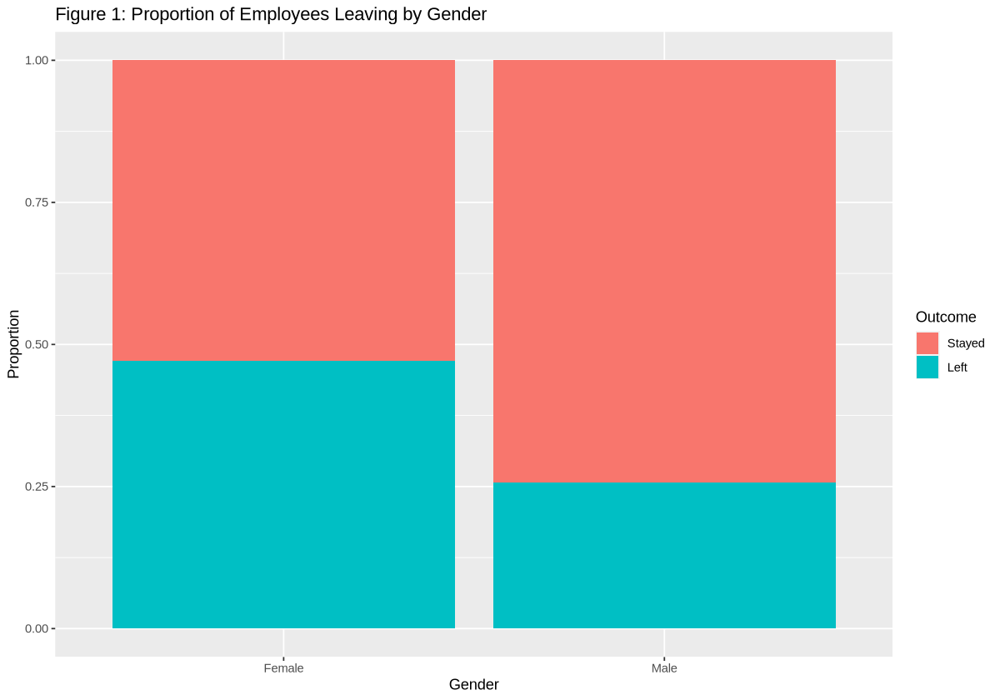

In [6]:
options(repr.plot.width = 10, repr.plot.height = 7)

figure1 <- ggplot(data, aes(x=Gender, fill=as.factor(LeaveOrNot))) + 
        geom_bar(position="fill") + 
        scale_fill_discrete(labels=c("Stayed", "Left")) + 
        labs(y="Proportion", fill="Outcome") + 
        ggtitle("Figure 1: Proportion of Employees Leaving by Gender")
figure1

Figure 1 reveals a gender difference in turnover. While women have a near-even split between staying and leaving, with a slight preference for staying, men are more likely to remain than depart. 

Next, to understand if age or experience influences this decision, we'll visualize the distribution of these factors for those who stayed and those who left using boxplots.

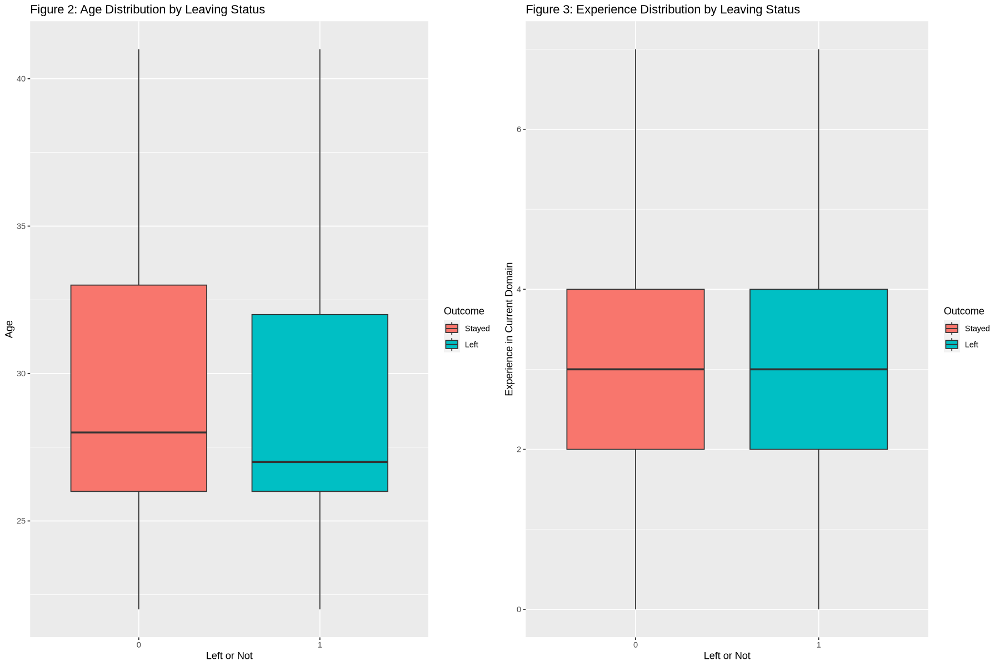

In [7]:
options(repr.plot.width = 15, repr.plot.height = 10)

figure2 <- ggplot(data, aes(x=as.factor(LeaveOrNot), y=Age, fill=as.factor(LeaveOrNot))) + 
        geom_boxplot() + 
        scale_fill_discrete(labels=c("Stayed", "Left")) + 
        labs(x="Left or Not", y="Age", fill="Outcome") + 
        ggtitle("Figure 2: Age Distribution by Leaving Status")
figure3 <- ggplot(data, aes(x=as.factor(LeaveOrNot), y=ExperienceInCurrentDomain, fill=as.factor(LeaveOrNot))) + 
        geom_boxplot() + 
        scale_fill_discrete(labels=c("Stayed", "Left")) + 
        labs(x="Left or Not", y="Experience in Current Domain", fill="Outcome") + 
        ggtitle("Figure 3: Experience Distribution by Leaving Status")

grid.arrange(figure2, figure3, ncol=2)

Analyzing age (Fig 2), we see a wider range for those who stayed, possibly indicating younger employees leave more. Years of experience (Fig 3) seem unrelated to departures. 

Finally, to explore education, city, and salary further, we'll use grouped bar charts to identify potential correlations with turnover.

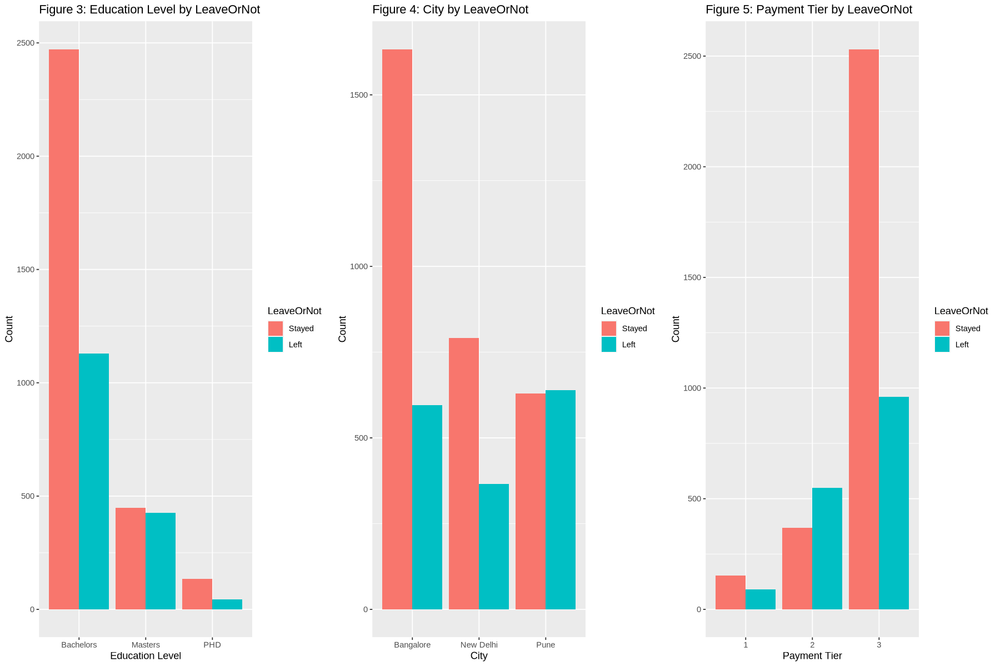

In [8]:
# Grouped Bar Charts for Education, City, Payment Tier by LeaveOrNot
figure3 <- ggplot(data, aes(x = Education, fill=LeaveOrNot)) +
        geom_bar(position = "dodge") +
        scale_fill_discrete(labels=c("Stayed", "Left")) + 
        labs(title = "Figure 3: Education Level by LeaveOrNot", x = "Education Level", y = "Count")

figure4 <- ggplot(data, aes(x = City, fill = LeaveOrNot)) +
        geom_bar(position = "dodge") +
        scale_fill_discrete(labels=c("Stayed", "Left")) + 
        labs(title = "Figure 4: City by LeaveOrNot", x = "City", y = "Count") 

figure5 <- ggplot(data, aes(x = PaymentTier, fill = LeaveOrNot)) +
        geom_bar(position = "dodge") +
        scale_fill_discrete(labels=c("Stayed", "Left")) + 
        labs(title = "Figure 5: Payment Tier by LeaveOrNot", x = "Payment Tier", y = "Count")

grid.arrange(figure3, figure4, figure5, ncol=3)

Analyzing education level reveals some interesting trends. While a Bachelor's degree is common across all employees (Fig 3), those who leave the company are more likely to hold one compared to those with higher qualifications. This suggests a potential link between education level and departure.

Location also seems to play a role (Fig 4). Bangalore retains the most employees, possibly due to a larger workforce or strong retention strategies. Interestingly, New Delhi has a higher number of leavers compared to Pune despite similar retention rates. This hints at location-specific factors influencing decisions, such as job markets or company policies.

Finally, salary emerges as a significant factor (Fig 5). Payment Tier 3, with the highest salaries, boasts significantly lower turnover compared to Tiers 1 and 2. This suggests a clear correlation between higher pay and employee retention.

To gain a more holistic understanding of these factors' influence, we'll use a pairplot to visualize the distribution of all variables.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwid

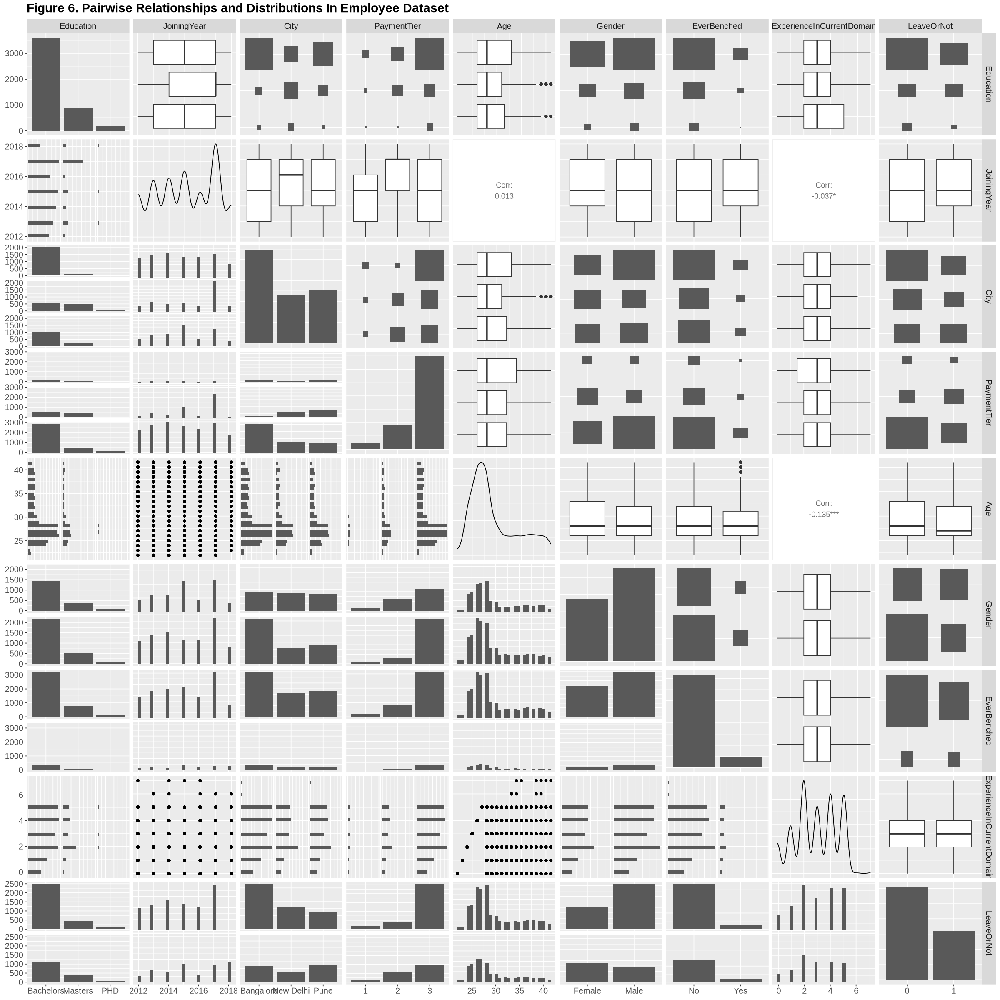

In [9]:
options(repr.plot.width = 20, repr.plot.height = 20)


pair_plots <- data %>%
    ggpairs(progress = FALSE) +
    ggtitle("Figure 6. Pairwise Relationships and Distributions In Employee Dataset") +
  theme(
    text = element_text(size = 15),
    plot.title = element_text(face = "bold"),
    axis.title = element_text(face = "bold")
  )

pair_plots

The pairwise plot dives deeper into the workforce. We see a younger skew in employee age and a concentration in the highest salary tier. For education, Bachelor's degrees dominate, with far fewer PhDs.

An interesting find emerges in "Experience in Current Domain" across payment tiers. While there's a trend of more experience in higher tiers, it's not a perfect correlation. This suggests career progression might be present, but experience isn't the sole factor in pay.

There's nothing too notable with the variables JoiningYear and EverBenched, as it does not seem to be a heavy correlation between those variables and LeaveOrNot

Finally, "LeaveOrNot" stands out with a significant imbalance. There are twice as many employees who stay compared to those who leave. This could cause issues when building a predictive model.

Overall, the analysis hints at potential links between various factors like age, education, and salary with employee turnover. These could be useful for predicting departures.

## Methods 

To answer our question, we will follow these steps. 

**1. Data Splitting:**

- Divide the dataset into training (70%) and testing (30%) sets using a stratified sampling approach to maintain the proportion of the outcome variable across both sets. This ensures that both the training and testing datasets are representative of the overall data.

**2. Variable Selection:**

* Backward Selection: Start with a full model including all predictors and iteratively remove the least significant variable based on p-values and AIC until no further reduction in AIC is observed.
* LASSO (Least Absolute Shrinkage and Selection Operator): Implement LASSO regression to enforce regularization, which helps in reducing overfitting and selecting relevant variables. Use cross-validation to find the optimal lambda value that minimizes the AIC and identifies a subset of predictors with non-zero coefficients. We choose to use $\hat{\lambda}_{\text{1SE}}$ because it allows us to select a simpler, more interpretable model without significantly reducing AUC. 

**3. Fit two logistic regression models for prediction:**

* Model from Backward Selection: Use the predictors selected by backward selection with the lowest AIC.
* Model from LASSO: Use the predictors identified by LASSO with the lambda that minimizes AUC.

**4. Model Selection with AUC:**

* Evaluate both models using the Area Under the ROC Curve (AUROC) metric on the testing data to assess their ability to discriminate between the classes accurately.
* Select the model that shows the highest AUROC as the final model for deeper analysis.

**5. Performance Evaluation:**

* Use the chosen model to predict employee turnover on the testing set.
* Plot ROC curve and obtain the AUROC for the chosen model
* Plot PRC curve and obtain the AUPRC for the chosen model
* Create a confusion matrix and obtain accuracy, sensitivity, specificity, precision, accuracy, and Cohen's Kappa scores.

Our chosen methods, logistic regression and variable selection through LASSO and backward selection, offer a powerful combination for analyzing our binary outcome variable "LeaveOrNot." Logistic regression's strength lies in its ability to handle diverse data types (numerical and categorical) and provide interpretable results for understanding employee turnover predictions. The variable selection techniques address potential issues with high-dimensional data. LASSO tackles overfitting by selecting relevant variables and applying regularization, while backward selection systematically removes the least significant ones, ensuring model complexity doesn't overshadow predictive power.

However, it's crucial to acknowledge limitations. LASSO assumes linearity between variables and relies heavily on tuning the regularization parameter. Additionally, both methods have limitations. LASSO may introduce bias in coefficient estimations, and backward selection assumes the initial full model captures all relevant interactions, which might not always be true. Despite these limitations, the combination of these techniques provides a robust framework for identifying the most significant factors influencing employee turnover.

## Implementation

First we divide the data into 70% for training and 30% for testing, such proportions were carefully chosen to ensure enough data for robust model training while still leaving a substantial amount for testing.

In [37]:
set.seed(1)

data$id <- 1:nrow(data)

data_train <- 
    data %>% 
    slice_sample(prop = 0.7)

data_test <- 
    data %>% 
    anti_join(data_train, by = "id")

data_train <-
    data_train %>%
    dplyr::select(-id)

data_test <-
    data_test %>%
    dplyr::select(-id)

head(data_train)

,Education,JoiningYear,City,PaymentTier,Age,Gender,EverBenched,ExperienceInCurrentDomain,LeaveOrNot
,<fct>,<int>,<fct>,<fct>,<int>,<fct>,<chr>,<int>,<fct>
1,Bachelors,2014,Bangalore,3,25,Female,No,3,0
2,Masters,2016,New Delhi,3,28,Female,No,2,0
3,Bachelors,2012,Pune,2,27,Female,No,5,1
4,Bachelors,2014,Bangalore,3,24,Male,No,2,0
5,Bachelors,2013,Bangalore,1,28,Female,No,1,0
6,Bachelors,2018,Bangalore,3,26,Female,No,4,1


We will first perform backward selection, starting with a full set of predictors and then removing predictors one at a time, based on their AIC score.

In [38]:
set.seed(1004)


full_model <- glm(LeaveOrNot ~ ., data = data_train, family = binomial)


step.model <- stepAIC(full_model, direction = "backward")

Start:  AIC=3674.15
LeaveOrNot ~ Education + JoiningYear + City + PaymentTier + Age + 
    Gender + EverBenched + ExperienceInCurrentDomain

                            Df Deviance    AIC
<none>                           3650.1 3674.1
- ExperienceInCurrentDomain  1   3653.0 3675.0
- Age                        1   3657.0 3679.0
- EverBenched                1   3676.1 3698.1
- Education                  2   3691.7 3711.7
- JoiningYear                1   3702.6 3724.6
- PaymentTier                2   3706.0 3726.0
- City                       2   3746.4 3766.4
- Gender                     1   3766.4 3788.4


In [39]:
summary(step.model)


Call:
glm(formula = LeaveOrNot ~ Education + JoiningYear + City + PaymentTier + 
    Age + Gender + EverBenched + ExperienceInCurrentDomain, family = binomial, 
    data = data_train)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-2.0686  -0.8187  -0.6151   1.0115   2.2858  

Coefficients:
                            Estimate Std. Error z value Pr(>|z|)    
(Intercept)               -3.299e+02  4.605e+01  -7.163 7.87e-13 ***
EducationMasters           7.259e-01  1.142e-01   6.359 2.03e-10 ***
EducationPHD               8.057e-03  2.368e-01   0.034  0.97285    
JoiningYear                1.638e-01  2.286e-02   7.166 7.73e-13 ***
CityNew Delhi             -5.660e-01  1.180e-01  -4.795 1.63e-06 ***
CityPune                   5.693e-01  1.028e-01   5.537 3.08e-08 ***
PaymentTier2               7.881e-01  1.924e-01   4.096 4.20e-05 ***
PaymentTier3              -3.161e-02  1.757e-01  -0.180  0.85728    
Age                       -2.233e-02  8.590e-03  -2.599  0.00935 

In [40]:
features_models <- 
    tibble(
        model = c("Backward"),
        features = c(length(coef(step.model))))

features_models

model,features
<chr>,<int>
Backward,12


Next, we will perform LASSO, selecting the optimal lambda through cross-validation aimed at maximizing the Area Under the ROC Curve (AUC) for predictive accuracy. 

In [41]:
### perform LASSO

set.seed(203)

model_matrix_X_train <- 
    model.matrix(object=LeaveOrNot~., data=data_train)
model_matrix_X_train <- model_matrix_X_train[, !colnames(model_matrix_X_train) %in% c("(Intercept)", "LeaveOrNot")]


matrix_Y_train <- 
    as.matrix(data_train$LeaveOrNot, ncol = 1)

In [42]:
set.seed(304)

cv_lambda_LASSO <- 
  cv.glmnet(
  x = model_matrix_X_train, y = matrix_Y_train,
  alpha = 1,
  family = "binomial",
  type.measure = "auc",
  nfolds = 5)

cv_lambda_LASSO


Call:  cv.glmnet(x = model_matrix_X_train, y = matrix_Y_train, type.measure = "auc",      nfolds = 5, alpha = 1, family = "binomial") 

Measure: AUC 

      Lambda Index Measure       SE Nonzero
min 0.001377    50  0.7377 0.007862      10
1se 0.016975    23  0.7300 0.008282       8

In [43]:
lambda_1se_AUC_LASSO <- round(cv_lambda_LASSO$lambda.1se, 4)

lambda_1se_AUC_LASSO

[1] 0.017

In [44]:
set.seed(1234)

LASSO_1se_AUC <- glmnet(
  x = model_matrix_X_train, y = matrix_Y_train,
  alpha = 1,
  family = "binomial",
  lambda = lambda_1se_AUC_LASSO
)

LASSO_1se_AUC

coef(LASSO_1se_AUC)


Call:  glmnet(x = model_matrix_X_train, y = matrix_Y_train, family = "binomial",      alpha = 1, lambda = lambda_1se_AUC_LASSO) 

  Df  %Dev Lambda
1  8 11.75  0.017

12 x 1 sparse Matrix of class "dgCMatrix"
                                     s0
(Intercept)               -2.347640e+02
EducationMasters           4.047997e-01
EducationPHD               .           
JoiningYear                1.161886e-01
CityNew Delhi             -1.776793e-01
CityPune                   5.292696e-01
PaymentTier2               7.046147e-01
PaymentTier3               .           
Age                       -5.911384e-04
GenderMale                -6.805887e-01
EverBenchedYes             3.731604e-01
ExperienceInCurrentDomain  .           

In [45]:
features_models <- 
    features_models %>% 
    add_row(model = "LASSO", 
            features = sum(coef(LASSO_1se_AUC) != 0))
features_models

model,features
<chr>,<int>
Backward,12
LASSO,9


In [46]:
# Evaluation metrics
set.seed(123)


# Predictions for backward selection model
predictions_backward <- predict(step.model, newdata = data_test, type = "response")
roc_backward <- roc(data_test$LeaveOrNot, predictions_backward)
auc_backward <- auc(roc_backward)

# Predictions for LASSO model
model_matrix_X_test <- 
    model.matrix(object = LeaveOrNot~.,
                 data = data_test)[, -1]

predictor_LASSO <- predict(LASSO_1se_AUC, newx = model_matrix_X_test)[,"s0"] 
roc_lasso <- 
    roc(
        response = data_test$LeaveOrNot,
        predictor = predictor_LASSO) 
auc_lasso <- auc(roc_lasso)

Setting levels: control = 0, case = 1

Setting direction: controls < cases

Setting levels: control = 0, case = 1

Setting direction: controls < cases



In [47]:
AUC_models <- 
    tibble(
        model = c("Backward", "LASSO"),
        auc = c(auc_backward, auc_lasso))

AUC_models

model,auc
<chr>,<dbl>
Backward,0.7389906
LASSO,0.7252012


Based on the AUC, backward selection seems to be the better performing model so we will choose the backward selection model.  

### Results

Our model using all variables achieved an AUROC of 0.725. This suggests good discrimination between employees who leave and those who stay (0.5 = random guessing, 1.0 = perfect discrimination). While not perfect, the model performs significantly better than random chance. We'll visualize this performance with an AUROC plot next.

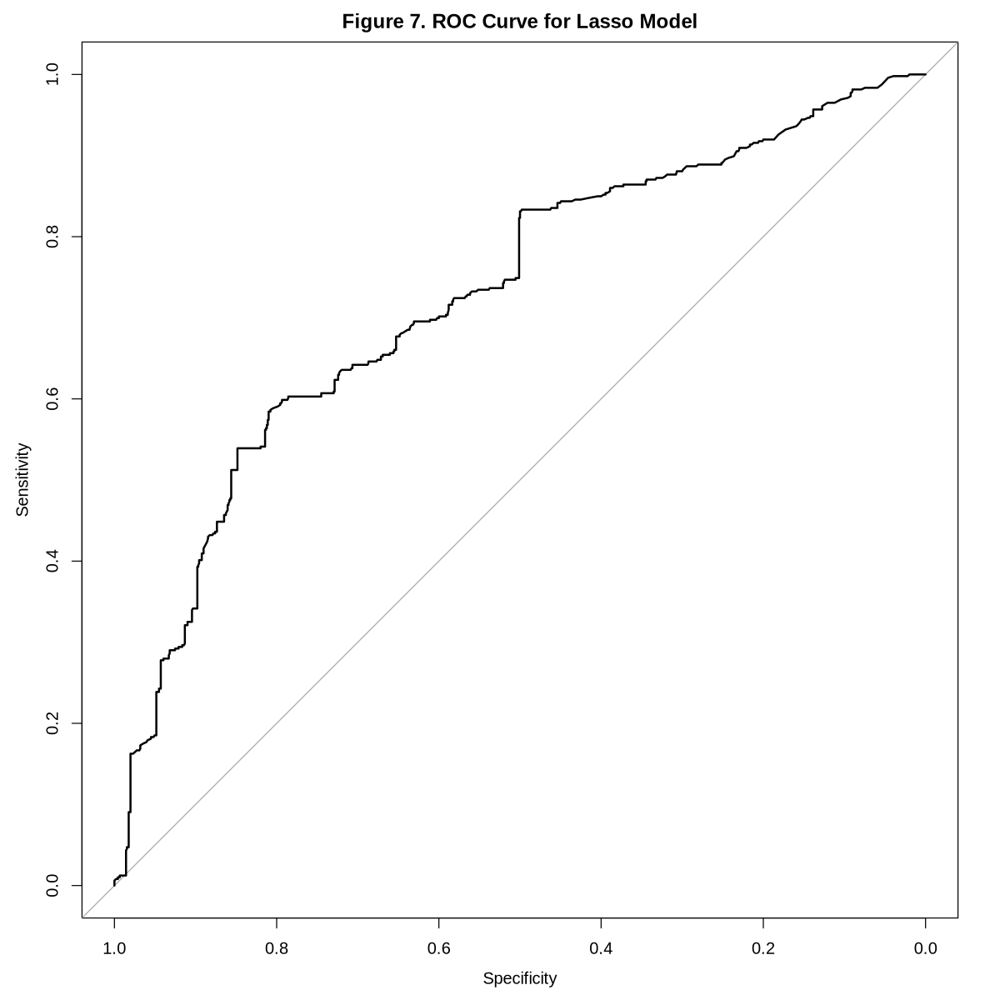

In [48]:
set.seed(123)

options(repr.plot.width = 10, repr.plot.height = 10)

plot(roc_lasso, main = "Figure 7. ROC Curve for Lasso Model")

The AUROC curve demonstrates a model with good predictive performance, better than random guessing, indicated by the curve's position above the diagonal line of no discrimination. While the model is capable of distinguishing between the classes, there is potential for enhancement, possibly by refining the model or by employing additional relevant features. Given the space above the curve, there could be possible improvements done to yield a higher AUC.

Due to our imbalanced dataset (more employees stay than leave), let's also evaluate the model using precision-recall analysis. Here, a high AUPRC indicates good performance in identifying those who actually leave (positive class) while maintaining good precision. We'll calculate the model's AUPRC to get a more nuanced understanding of its effectiveness.

In [49]:
set.seed(123)

# Extract labels for clarity
labels <- data_test$LeaveOrNot

# Calculate AUC-PRC and PR curve
prc_backward <- pr.curve(predictions_backward, labels, curve=TRUE)
prc_backward


  Precision-recall curve

    Area under curve (Integral):
     0.3068528 

    Area under curve (Davis & Goadrich):
     0.3068528 

    Curve for scores from  0.0629546  to  2 
    ( can be plotted with plot(x) )


The calculated AUPRC of approximately 0.528 suggests that the model has room for improvement in predicting employee departures. An AUPRC this close to 0.5, which represents random guessing, indicates the model's limited ability to differentiate between employees who will leave and those who will stay. In other words, the model is only slightly better than flipping a coin in predicting employee churn

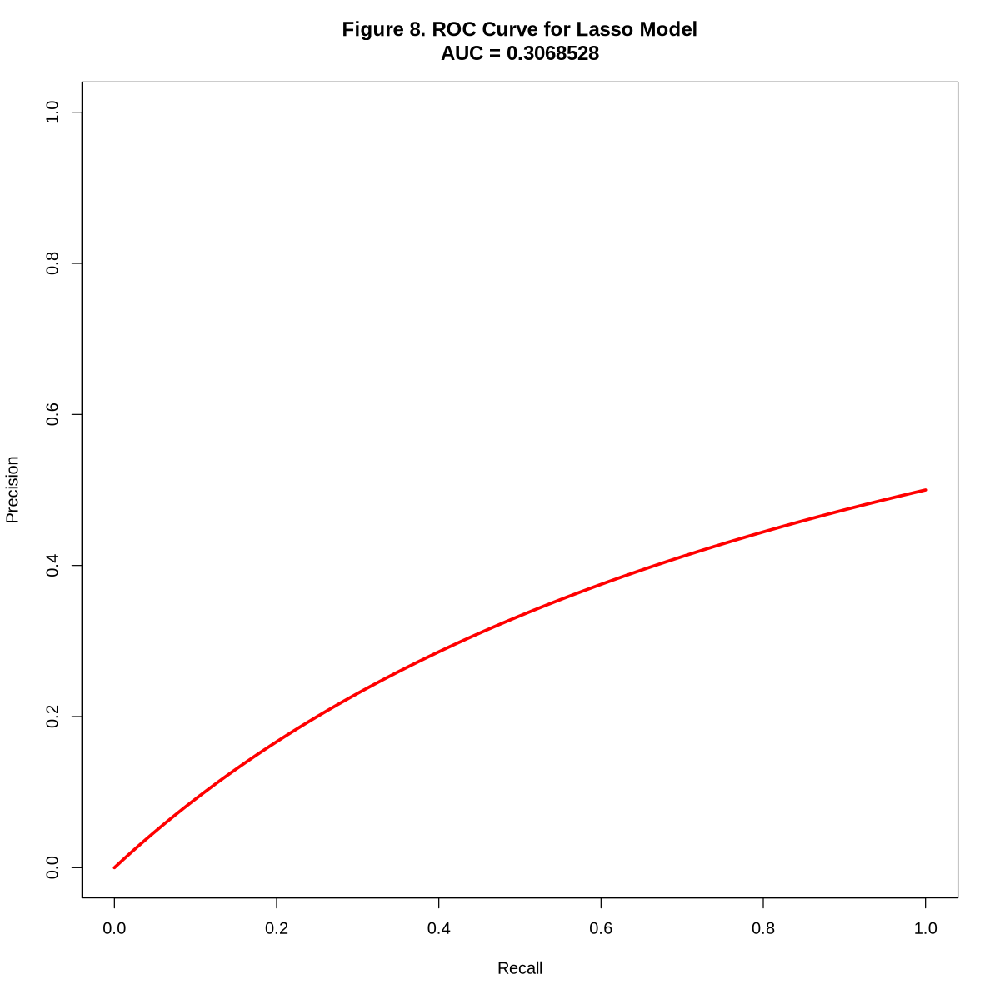

In [34]:
plot(prc_backward, color="red", main="Figure 8. ROC Curve for Lasso Model")

As shown in the PR curve, the model's performance is modest. While it does show some ability to identify employees who will leave, its performance is not very different from random guessing. The most noteworthy part of this graph is the sharp drop at the end of the curve. This indicates that As the model aims to capture every employee who is likely to leave (recall approaches 1), it becomes less discerning, leading to a scenario where it predicts a large number of employees will leave, regardless of the likelihood. 

Lastly, we will plot a confusion matrix using the threshold of 0.4 and a positive class for 1 since we a predicting whether an employee will leave. Using a threshold of 0.4 for predicting employee departures prioritizes catching potential leavers early (higher recall) without a big jump in incorrectly identifying happy employees (false positives). This allows for earlier intervention efforts.


In [35]:
# Convert probabilities to binary predictions
binary_predictions_backward <- ifelse(predictions_backward > 0.4, 1, 0)

# Actual responses
actual_responses <- data_test$LeaveOrNot

# Confusion matrix for the backward selection model
conf_matrix_backward <- confusionMatrix(as.factor(binary_predictions_backward), 
                                        as.factor(actual_responses), 
                                        positive = "1")
print(conf_matrix_backward)

Confusion Matrix and Statistics

          Reference
Prediction   0   1
         0 744 209
         1 166 277
                                          
               Accuracy : 0.7314          
                 95% CI : (0.7073, 0.7545)
    No Information Rate : 0.6519          
    P-Value [Acc > NIR] : 1.18e-10        
                                          
                  Kappa : 0.3957          
                                          
 Mcnemar's Test P-Value : 0.03009         
                                          
            Sensitivity : 0.5700          
            Specificity : 0.8176          
         Pos Pred Value : 0.6253          
         Neg Pred Value : 0.7807          
             Prevalence : 0.3481          
         Detection Rate : 0.1984          
   Detection Prevalence : 0.3173          
      Balanced Accuracy : 0.6938          
                                          
       'Positive' Class : 1               
                              

The model achieves an accuracy of 73.14%, which suggests it correctly predicts whether an employee will stay or leave in approximately 73 out of 100 cases. The sensitivity of the model is 57%, indicating it correctly identifies 57% of the employees who actually leave, while the specificity is much higher at 81.76%, showing it is better at identifying those who will not leave. The precision is 62.53%, meaning that when the model predicts an employee will leave, it is correct about 62.53% of the time. The kappa statistic of 0.3957 suggests moderate agreement beyond chance between the predictions and actual outcomes.

## Discussion 

Our model has a 73.90% accuracy score using the area under curve (AUC) metric by backward selection, and a slightly lower 73.14% flat accuracy score. The skewed distributions observed in certains variables like education, city, and payment tiers, coupled with AUC ability to account for class imbalance, likely contributed to the higher AUC accuracy (Figures 3-5). Additionally, we noticed that backward selection outperformed the least absolute shrinkage and selection operator (Lasso) method. Creating the model using Lasso yielded a 72.52% accuracy, which was 1.38% lower than backward selection. Our final model for both backward selection and Lasso included all 9 features. Thus, we decided to proceed with further evaluation using the model built by backward selection. 
Out of the 1396 observations used in our training data, we observed a 41.15% true positive rate and a 90.22% true negative rate. Our model has a much higher identification rate for negative cases, where employees chose to stay, compared to positive cases, where employees chose to leave. Looking at the data summary, we noticed that there were a larger proportion of employees that chose to stay (n=3053) than leave (n=1600), which could be a huge contributing factor to the lower sensitivity but higher model specificity. 

Since our model is designed to predict employee turnover, achieving an extremely high accuracy, such as a 99%, is not necessary. Models with accuracy above 70% are acceptable for industry standards, and given the context of our model and its purpose, it does perform at an industrial level. Thus, this model can be applied for future use when it comes to employee evaluation and hiring scenarios. 

To improve the prediction model, several avenues could be explored. Firstly, refining the feature selection process could enhance the model's predictive performance. Instead of solely relying on lasso and backward selection methods, incorporating domain knowledge or exploring alternative feature selection techniques such as forward selection or recursive feature elimination could lead to a more robust and interpretable model. Additionally, considering interactions between variables or incorporating nonlinear relationships through polynomial features, could further improve the model's accuracy and predictive power. Specifically, we should conduct a thorough analysis of the residual errors to detect any patterns or biases that the model might have missed. By examining the residuals for randomness, we can identify any systematic errors or underlying patterns that the model fails to capture. Additionally, incorporating data transformations (log, square root, add squared term etc.) or feature engineering techniques could help improve the model's ability to capture complex relationships and non-linear patterns in the data.

Moving forward, this study opens several avenues for future research. One could investigate the impact of specific HR interventions, like flexible working arrangements or recognition programs, on employee retention rates. Analyzing the differential impact of such strategies across various demographic groups (like age or gender) or job types could yield tailored retention strategies. Additionally, exploring the psychological or cultural factors influencing employee turnover could provide deeper behavioral insights that are not readily captured through traditional data. Ultimately, longitudinal studies tracking the same employees over time could offer a more dynamic view of employee behavior and retention in response to organizational changes.

## References

Al-Suraihi, W. A., Samikon, S. A., Al-Suraihi, A.-H. A., & Ibrahim, I. (2021). Employee turnover: Causes, importance and retention strategies. European Journal of Business and Management Research, 6(3), 1–10. doi:10.24018/ejbmr.2021.6.3.893

Abdullah Al Mamun, C., & Nazmul Hasan, Md. (2017). Factors affecting employee turnover and sound retention strategies in Business Organization: A conceptual view. Problems and Perspectives in Management, 15(1), 63–71. doi:10.21511/ppm.15(1).2017.06 

De Winne, S., Marescaux, E., Sels, L., Van Beveren, I., & Vanormelingen, S. (2018). The impact of employee turnover and turnover volatility on labor productivity: A flexible non-linear approach. The International Journal of Human Resource Management, 30(21), 3049–3079. doi:10.1080/09585192.2018.1449129 

Elmetwally, T. (2023). Employee dataset. Retrieved from https://www.kaggle.com/datasets/tawfikelmetwally/employee-dataset/data?select=Employee.csv 

Wai, F. (n.d.). How your employee turnover rate impacts your business. Retrieved from https://blog.jostle.me/blog/employee-turnover-rate 

